In [107]:
# Utility
import os
import glob
import random
import copy
# Hyperparameter tuning
import optuna
# Output control
import warnings
warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING)
# Computer vision
from PIL import Image, ImageOps
# Data science
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
# Machine learning
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
import umap
import umap.plot
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import confusion_matrix, roc_auc_score, matthews_corrcoef, precision_score, \
    balanced_accuracy_score, f1_score, recall_score,fbeta_score,accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from sklearn.svm import SVC
# Image processing
import skimage.feature as skif
import cv2
from skimage import io, color, measure
import skimage.filters as skifilters
# Deep learning
import torch
import torch.nn as nn 
import torchvision.models as models
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import pytorch_lightning as pl
import torch.optim as optim
# Consider aesthetics 
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'
plt.rcParams['axes.axisbelow'] = True
plt.rcParams.update({'font.size': 20})

In [3]:
!pip install pip torchsummary > /dev/null 
from torchsummary import summary

# **Project outline**

**In this notebook, our objectives are as follows:**
1. Perform universal feature extraction from images using dimensionality reduction techniques and subsequently make predictions using classical ML algorithms.
2. Perform image-specific feature extraction from the images and make predictions using classical ML algorithms.
3. Utilize a pre-trained CNN network with a custom MLP head to automatically extract features and make predictions.
4. Utilize a custom CNN network for automatic feature extraction and predictions.

In the final section of this notebook, we will compare these methods, discussing their drawbacks and benefits.

For each model we perform hyperparameter tuning using Bayesian optimization with the `optuna` library.

---

*We set the seed for random CPU, GPU processes to allow for reproducability.*

In [4]:
torch.manual_seed(42)
np.random.seed(42)

# **Data structure handling & class label creation**

The dataset is divided into three main folders, namely "train," "test," and "val," with each folder containing subfolders for different image categories, specifically "Pneumonia" and "Normal". The dataset consists of a total of 5,863 X-Ray images in JPEG format.

We create tree typical DataFrame structures for the train, validation and test set. 
First we utilize `glob` to grab all the image links in each subfolder that correspond to each of the classes using UNIX file searching:

In [61]:
# Training set
train_normal = glob.glob("../input/chest-xray-pneumonia/chest_xray/train/NORMAL/*")
train_pneumonia = glob.glob("../input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA/*")

# Test set
test_normal =  glob.glob("../input/chest-xray-pneumonia/chest_xray/test/NORMAL/*")
test_pneumonia = glob.glob("../input/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/*")

# Validation set
val_normal = glob.glob("../input/chest-xray-pneumonia/chest_xray/val/NORMAL/*")
val_pneumonia = glob.glob("../input/chest-xray-pneumonia/chest_xray/val/PNEUMONIA/*")


Of course we need to assign class labels: $Normal = 0,\ Viral\ Pneumonia = 1.$  We utilize `numpy` to achieve this

In [62]:
labels_dict = {0:'Normal',1:"Pneumonia"}

In [63]:
# Training set labels
train_normal_labels =  np.zeros(len(train_normal),dtype=int)
train_pneumonia_labels = np.ones(len(train_pneumonia),dtype=int)
train_labels = np.concatenate((train_normal_labels,train_pneumonia_labels))

# Test set labels
test_normal_labels =  np.zeros(len(test_normal),dtype=int)
test_pneumonia_labels = np.ones(len(test_pneumonia),dtype=int)
test_labels = np.concatenate((test_normal_labels,test_pneumonia_labels))

# Validation set labels
val_normal_labels =  np.zeros(len(val_normal),dtype=int)
val_pneumonia_labels = np.ones(len(val_pneumonia),dtype=int)
val_labels = np.concatenate((val_normal_labels,val_pneumonia_labels))

Having created the labels we can now define the three distinct dataframes:

In [64]:
#Training set 
train_all = train_normal  + train_pneumonia
train_df = pd.DataFrame({"image":train_all,
                        "label":train_labels})
#Test set 
test_all =  test_normal  + test_pneumonia
test_df = pd.DataFrame({"image":test_all,
                       "label":test_labels})
#Validation set 
val_all =  val_normal  + val_pneumonia
val_df = pd.DataFrame({"image":val_all,
                      "label":val_labels})

print(f"Training Set, size = {train_df.shape}\n",train_df.head(),"\n")
print(f"Test Set, size = {test_df.shape}\n",test_df.head(),"\n")
print(f"Validation Set,size = {val_df.shape}\n",val_df.head(),"\n")

Training Set, size = (5216, 2)
                                                image  label
0  ../input/chest-xray-pneumonia/chest_xray/train...      0
1  ../input/chest-xray-pneumonia/chest_xray/train...      0
2  ../input/chest-xray-pneumonia/chest_xray/train...      0
3  ../input/chest-xray-pneumonia/chest_xray/train...      0
4  ../input/chest-xray-pneumonia/chest_xray/train...      0 

Test Set, size = (624, 2)
                                                image  label
0  ../input/chest-xray-pneumonia/chest_xray/test/...      0
1  ../input/chest-xray-pneumonia/chest_xray/test/...      0
2  ../input/chest-xray-pneumonia/chest_xray/test/...      0
3  ../input/chest-xray-pneumonia/chest_xray/test/...      0
4  ../input/chest-xray-pneumonia/chest_xray/test/...      0 

Validation Set,size = (16, 2)
                                                image  label
0  ../input/chest-xray-pneumonia/chest_xray/val/N...      0
1  ../input/chest-xray-pneumonia/chest_xray/val/N...      0
2  ../

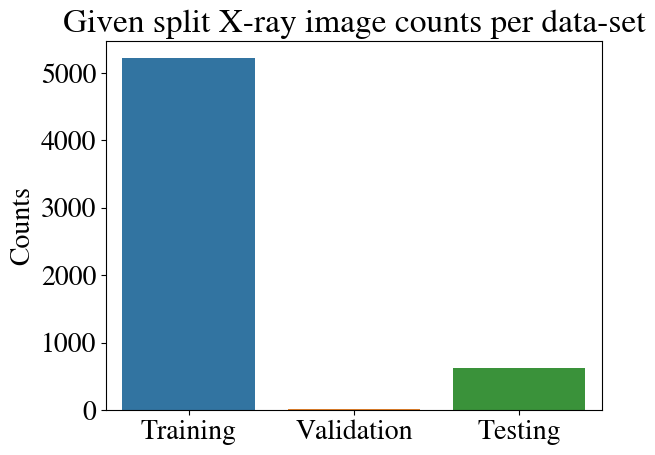

In [65]:
sns.barplot(x = ['Training','Validation','Testing'],y =[train_df.shape[0],val_df.shape[0],test_df.shape[0]])
plt.title("Given split X-ray image counts per data-set")
plt.ylabel("Counts")
plt.show()

We can notice from above that the validation set is extremely small $\approx 0.003\%$ of the size of the training set, this means we should merge the training set with the validation set and create a new split that has $20\%$ of the training size and the same label distribution using a stratified train test split.

In [66]:
train_dftotal = pd.concat([train_df,val_df], axis=0)
X = train_dftotal.drop('label', axis=1)
y = train_dftotal['label']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20, stratify=y, random_state=42, shuffle=True)

In [67]:
print(y_train.value_counts())
print(y_val.value_counts())

1    3106
0    1079
Name: label, dtype: int64
1    777
0    270
Name: label, dtype: int64


Now we have $524$ observations in our validation set, much closer to the $624$ of the training set.

We go ahead and redefine our training set dataframe to assist us in data exploration as well as the validation dataframe

In [68]:
train_df = pd.concat((X_train,y_train),axis=1)
train_df.reset_index(drop=True, inplace=True)
print("Training shape:",train_df.shape,"\n")
val_df = pd.concat((X_val,y_val),axis=1)
val_df.reset_index(drop=True, inplace=True)
print("Validation shape:",val_df.shape)

Training shape: (4185, 2) 

Validation shape: (1047, 2)


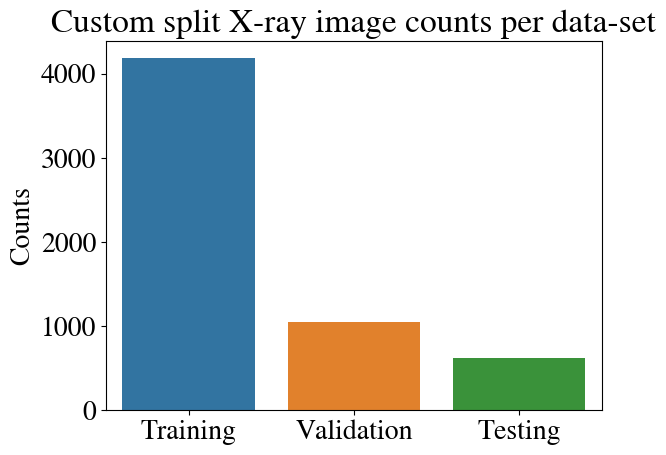

In [69]:
sns.barplot(x = ['Training','Validation','Testing'],y =[train_df.shape[0],val_df.shape[0],test_df.shape[0]])
plt.title("Custom split X-ray image counts per data-set")
plt.ylabel("Counts")
plt.show()

Finally we convert the image filepaths to the actual grayscale (since we have X-ray images) pixel intensity values using a mapping function and `cv2`.

---

# **Data Exploration**

## *Training set class balance*

As its evident from the plot below, the bacterial pneumonia has double the observations in the dataset compared to other classes, since this can lead to bias and misleading evaluation metrics. Metrics like Accuracy lose meaning. We can employ the  Matthews correlation coefficient (MCC): $$MCC = \frac{{TP \times TN - FP \times FN}}{{\sqrt{{(TP + FP)(TP + FN)(TN + FP)(TN + FN)}}}}$$
The MCC coefficient takes into account class imbalance, it ranges between -1 and +1, where +1 indicates a perfect prediction, 0 indicates a random prediction, and -1 indicates a completely incorrect prediction.

Additionally we can utilize weights appropriate for each class.

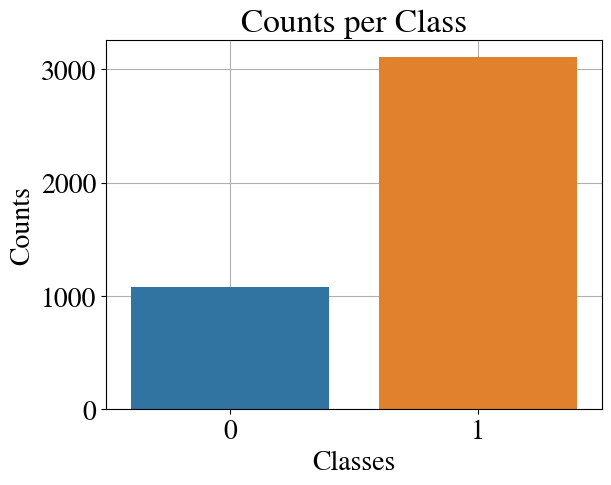

In [70]:
labelCounts = train_df['label'].value_counts()
sns.barplot(x = labelCounts.index,y = labelCounts.values)
plt.title("Counts per Class")
plt.ylabel("Counts")
plt.xlabel("Classes")
plt.grid(True)
plt.show()

Now we can calculate the calss weights based on each class label frequency in the dataset.

In [71]:
class_frequencies = labelCounts.values
total_samples = np.sum(class_frequencies)
class_weights = dict(zip(labelCounts.index,total_samples / class_frequencies))
class_weights

{1: 1.3473921442369607, 0: 3.8785912882298423}

## *Image exploration*

In order to get a random sample of images from the training set to inspect and load their respective pixel values, we code the following function: `getRandomImages` which takes as input a dataframe, a random seed and the number of images we wish to retrieve. It then samples these images from the dataframe and loads them as `PIL` objects. 

In [72]:
def getRandomImages(dataframe,seed,sample_size):
    images = []
    labels = []
    np.random.seed(seed)
    random_indices = dataframe.sample(n=sample_size, replace=False, random_state=seed).index
    

    for index in random_indices:
        image_link = dataframe['image'][index]
        image_label = dataframe['label'][index]
        image = Image.open(image_link)
        images.append(image)
        labels.append(image_label)
        
    return images,labels

#Call the function
images, labels = getRandomImages(dataframe = train_df,seed = 5,sample_size = 10)

In order to view the images and gain a first understanding, we create `supPlotimage` to present an illustration of the images we got from `getRandomImages` along with their:
- class labels
- image sizes
- intensity value range
- mean intensity value

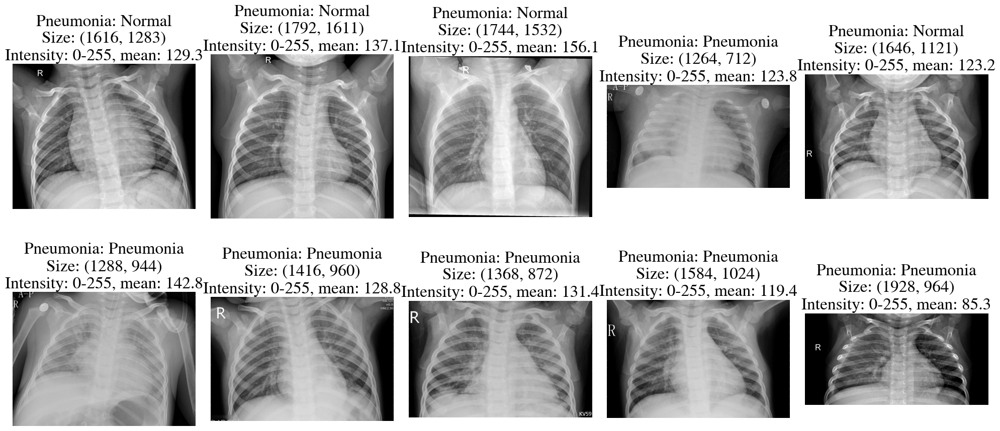

In [73]:
def supPlotimage(images, labels, row_num, col_num,verbose = 2):
    fig, axes = plt.subplots(row_num, col_num, figsize=(20, 10))
    for i, image in enumerate(images):
        row = i // col_num
        col = i % col_num
        
        axes[row, col].imshow(image, cmap="gray")
        axes[row, col].axis('off')
        if verbose ==0:
            continue
        elif verbose ==1:
            axes[row, col].set_title(f"Pneumonia: {labels_dict[labels[i]]}")
        elif verbose ==2:
            axes[row, col].set_title(f"Pneumonia: {labels_dict[labels[i]]}\nSize: {image.size}\nIntensity: {round(np.min(image),1)}-{round(np.max(image),1)}, mean: {round(np.mean(image),1)}")
        else:
            raise ValueError("Value for verbose should be an int, either 0, 1 or 2")
    
    plt.tight_layout()
    plt.show()

# Call the function for the 20 images and labels
supPlotimage(images,labels,row_num=2,col_num=5)

We also modify the above function to plot the intensity histograms of each of the images.

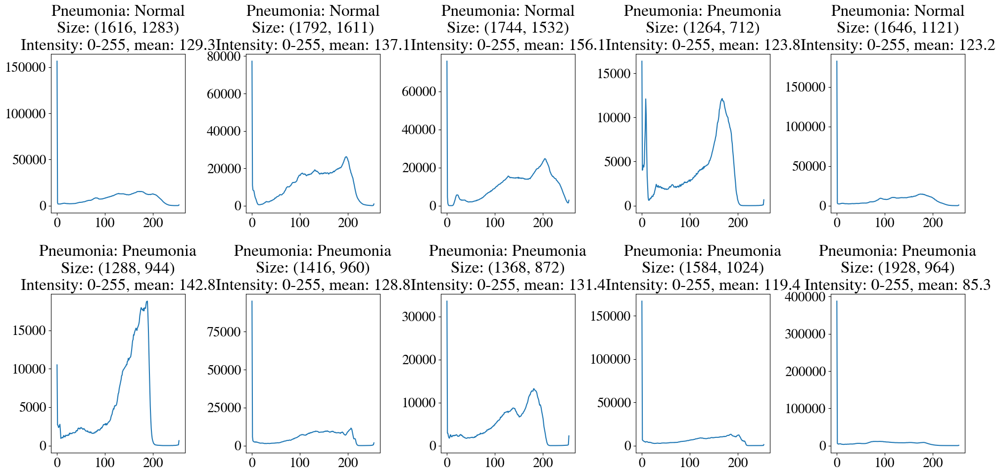

In [74]:
import matplotlib.pyplot as plt
from PIL import Image

def supPlotimagehist(images, labels, row_num, col_num, verbose = 2,single = True, normalized = False):
    fig, axes = plt.subplots(row_num, col_num, figsize=(20, 10))
    for i, image in enumerate(images):
        row = i // col_num
        col = i % col_num
        
        # Convert PIL image to numpy array
        image_array = np.array(image)
        if single and not normalized: 
            hist = np.histogram(image_array, bins=256, range=(0, 256))[0]
            axes[row, col].plot(hist)
        elif single and normalized:
            hist = np.histogram(image_array, bins=256, range=(0, 1))[0]
            axes[row, col].plot(hist)
        elif not single and normalized:
             for channel in range(3):
                hist = np.histogram(image_array[:, :, channel], bins=256, range=(0, 1))[0]
                axes[row, col].plot(hist, label=f"Channel {channel}")
        else:
            for channel in range(3):
                hist = np.histogram(image_array[:, :, channel], bins=256, range=(0, 256))[0]
                axes[row, col].plot(hist, label=f"Channel {channel}")
         
        if verbose == 0:
            continue
        elif verbose ==1:
            axes[row, col].set_title(f"Pneumonia: {labels_dict[labels[i]]}")
        elif verbose ==2:
            axes[row, col].set_title(f"Pneumonia: {labels_dict[labels[i]]}\nSize: {image.size}\nIntensity: {round(np.min(image),1)}-{round(np.max(image),1)}, mean: {round(np.mean(image),1)}")
        else:
            raise ValueError("Value for verbose should be an int, either 0, 1 or 2")
    
    plt.tight_layout()
    plt.show()

# Call the function for the 20 images and labels
supPlotimagehist(images, labels, row_num=2, col_num=5)

As you can see: 
- We have images of various size
- Images of various average intensity pixel values. 
- Some of the imeages appear slightly rotated 
- While all of them have completely black pixels with intensity equal to $0$ some images do not have pixels that reach the maximum intensity of $255$.

From the above we get a good idea of the preprocessing and transformation techniques we have to apply on the dataset.

---

# **Data Preprocessing \& Batch loading preperation**

As mentioned earlier, it is essential to address cofounding variables related to co-founders, including image size, overall intensity, and image rotation.

If we fail to average out or randomize these variables, we may inadvertently establish misleading associations between our classes: Normal, Viral Pneumonia, Bacterial Pneumonia, and the aforementioned cofounding factors. For instance, we might mistakenly 

## **Dataset Creation**

However we cant proceed with preprocessing without first having defined our actual dataset. The dataframes have worked so far, but we need a robust method to load image and labels. Thus we create a custom dataset by inheriting from PyTorch's `Dataset` class. This custom dataset will efficiently manage the retrieval and transformations of images for the training, test, and validation sets.

Most importantly this class can inplace apply the transformations we will define in the next stage:

In [75]:
class PneumoniaDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.data = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        image_path = self.data['image'][index]
        label = self.data['label'][index]
        label = torch.tensor(label)
        image = Image.open(image_path)
        image = ImageOps.equalize(image)
        
        if self.transform is not None:
            image = self.transform(image)
        

        return image, label

## **Data Augmentation pipeline**

We should be extra careful in this step, pretrained CNN models are sensitive and require their own  custom preprocessing unlike in the classical ML approach, or in a custom CNN model which we train from scratch. Thus we define seperate transformations that handles the preprocessing as definde in the majority of pretrained CNNs. This information can be found from [the Pytorch documentation](https://pytorch.org/vision/stable/models.html). 
Its also important to note that apart from the unique preprocessing,the majority pretrained models were trained on 3-chanel RGB images, thus we also need to replicate the intensity along 3-dimensions for such models.

Moving forward we define two seperate augmentation constructors, keep in mind the we require stronger data augmentation for deeper models so they wont overfit.

For the pretrained model

- Conversion from grayscale to RGB (compatibility with model)
- Histogram equalization since images have different contrast (contrast consistency)
- Resize to the pretrained models input (256,256) with a bicubic interpolation (same as pre-trained model) (model requirements)
- 10% translation either verticaly or horizontaly
- Random +20 to -20 degree rotation to limit the effect of the rotation cofounder (robustness to rotation)
- Cropping to the center as used for the majority of pre-trained models' preprocessing (model compatibility)
- Normalization following the one used in the majority of pre-trained models (standardization)

For the classic ML approach and our own CNN implementation:
- We leave the image grayscale, of course since we might have a colored image we convert them all to grayscale to be safe (format consistency)
- Perform histogram equalization since images have different contrast (contrast consistency)
- Resize it to 256 (size uniformity)
- Random +15 to -15 degree rotation to limit the effect of the rotation cofounder (robustness to rotation)
- Cropping to the center 
- Simple min max normalization (feature scaling)

Of course from the validation and test set we refrain from applying other techniques apart from resizing and scaling to the input size and scaling method.

In [78]:
train_data_pre = transforms.Compose([ 
    transforms.Grayscale(num_output_channels=3), 
    transforms.ToTensor(),
    transforms.Resize((256, 256), interpolation=Image.BICUBIC),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomApply([transforms.RandomAffine(0, translate=(0.1, 0.1))], p=0.5),
    transforms.RandomRotation((-20, +20)),
    transforms.CenterCrop(224),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_data_ml = transforms.Compose([
    transforms.ToTensor(),
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation((-15, +15)),
    transforms.CenterCrop(224),
    transforms.Normalize([0.5], [0.5])
    
])

test_val_data_pre = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),
    transforms.ToTensor(),
    transforms.Resize((224, 224),interpolation=Image.BICUBIC),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

test_val_data_ml = transforms.Compose([
    transforms.ToTensor(),
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((224, 224),interpolation=Image.BICUBIC),
    transforms.Normalize([0.5], [0.5])
])

# dataset for pretrained model 
train_dataset_pre = PneumoniaDataset(train_df,transform = train_data_pre)
val_dataset_pre = PneumoniaDataset(val_df,transform = test_val_data_pre)
test_dataset_pre = PneumoniaDataset(test_df,transform = test_val_data_pre)

# dataset for classical ml
train_dataset_ml = PneumoniaDataset(train_df,transform = train_data_ml)
val_dataset_ml = PneumoniaDataset(val_df,transform = test_val_data_ml)
test_dataset_ml = PneumoniaDataset(test_df,transform = test_val_data_ml)

Having defined the pipelines, now we only load the training, validation and test set we will need for 

### Visualization of the data augmentation results:

**This is the result of the transformation for the 10 first images of the training set for the pretrained model as well as their RGB histograms:**

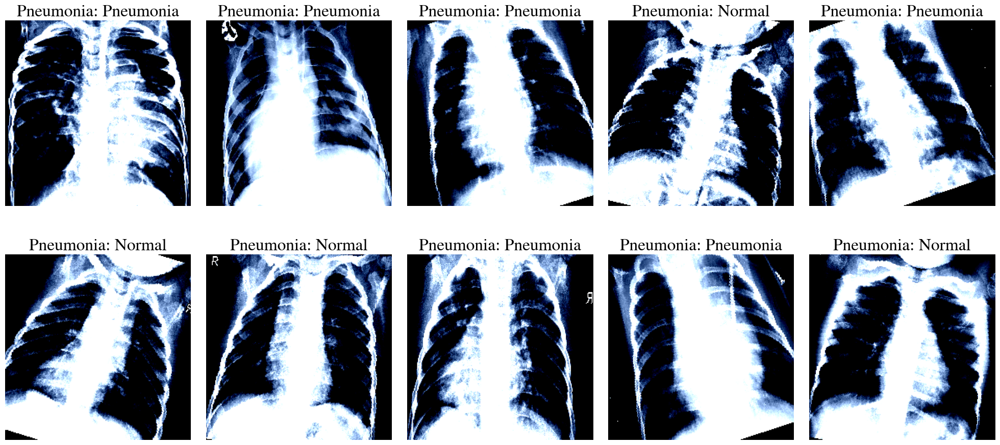

In [79]:
count = 0
images = []
labels = []
for image, label in train_dataset_pre:
    image = image.squeeze().numpy()  # Remove the extra dimension and convert to NumPy array
    image = np.transpose(image, (1, 2, 0))
    images.append(image)
    labels.append(label.item())
    if count == 9:
        break
    count += 1
        
supPlotimage(images,labels,row_num=2,col_num=5,verbose=1)

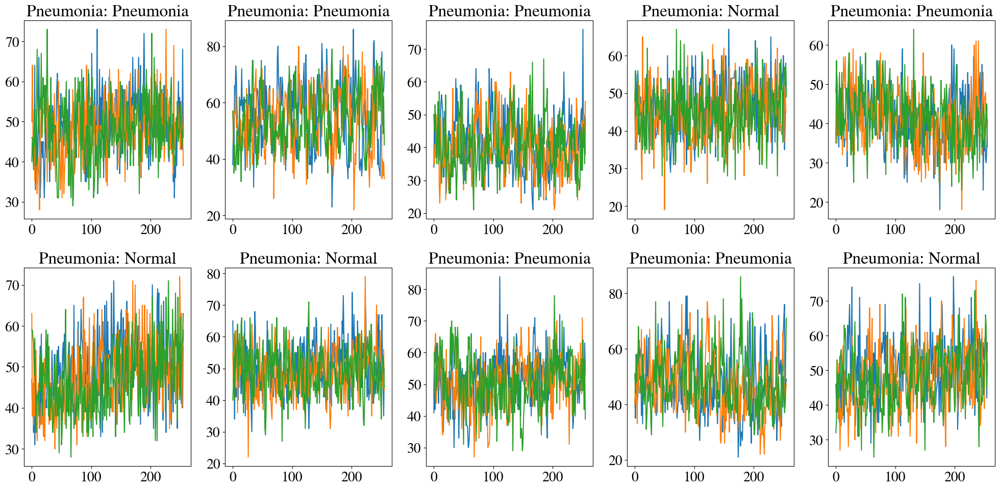

In [80]:
supPlotimagehist(images, labels, row_num=2, col_num=5,verbose =1,single=False,normalized=True)

**This is the result of the transformation for tahe same iamges but for the classical Ml, Custom CNN training set as well as their intensity histograms**

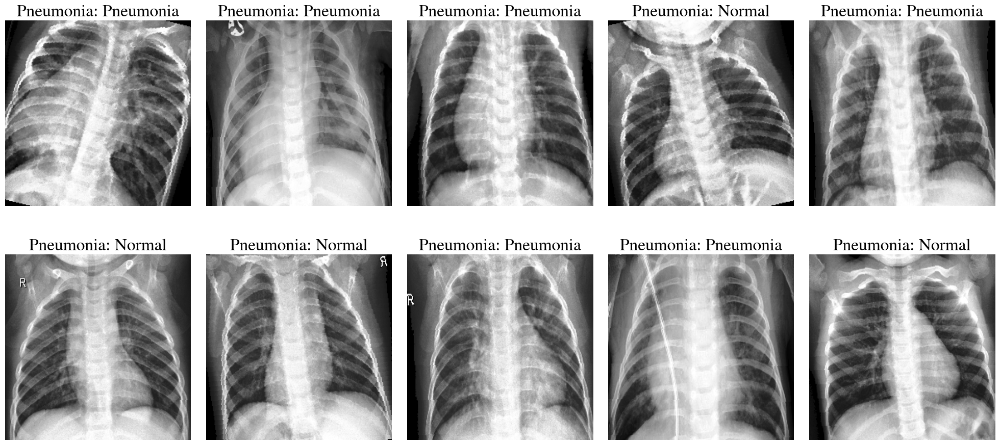

In [81]:
count = 0
images = []
labels = []
for image, label in train_dataset_ml:
    image = image.squeeze().numpy()  # Remove the extra dimension and convert to NumPy array
    images.append(image)
    labels.append(label.item())
    if count == 9:
        break
    count += 1
        
supPlotimage(images,labels,row_num=2,col_num=5,verbose=1)

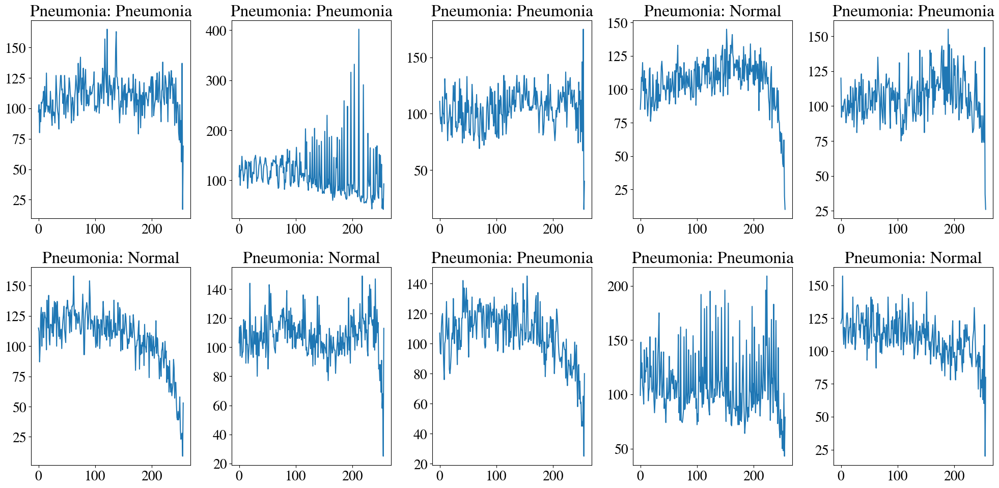

In [82]:
supPlotimagehist(images, labels, row_num=2, col_num=5,verbose = 1,normalized=True)

---

# **Traditional Machine Learning Approach**

Moving forward we try to distinct approaches:
1. We employ universal feature extraction using dimensionality reduction
2. We employ image specific feature extraction

## *1.Classical ML without image specific feature extraction but only dimensionality reduction based feature extraction*

In order to work with traditional ML techniques we first need to flatten the images in the dataset. Doing this:
- We have a feature vector of $224 \times 224 = 50176$ features for each observation/image
- And their target label which is a single int 

In [36]:
def flatten_dataset(dataset):
    X = np.zeros((len(dataset),50176))
    y = np.zeros((len(dataset)))
    for i in range(len(dataset)):
        image, label = dataset[i]
        flattened_image = image.reshape(-1).numpy()
        X[i,:] = flattened_image
        y[i] = label.item()
    return X, y

X_train, y_train = flatten_dataset(train_dataset_ml)
X_val, y_val = flatten_dataset(val_dataset_ml)
X_test, y_test = flatten_dataset(test_dataset_ml)

With CNNs we can achieve automatic feature extraction, however this is not the case for classical ML.  For this purpose we can utilize Truncated SVD, we dont use PCA since we have a sparse matrix with many 0 values due to dark pixels, we keep the components needed for a cummulative $\approx 95\%$ variance

In [52]:
svd = TruncatedSVD(n_components = 900 ,random_state = 42)
X_train_svd = svd.fit_transform(X_train)

Below we showcase the first two components of the SVD, with tota cummulative explained variance of each one of them:
- The normal non-pneumonia class is colored purple 
- The pneumonia patients are colored yellow

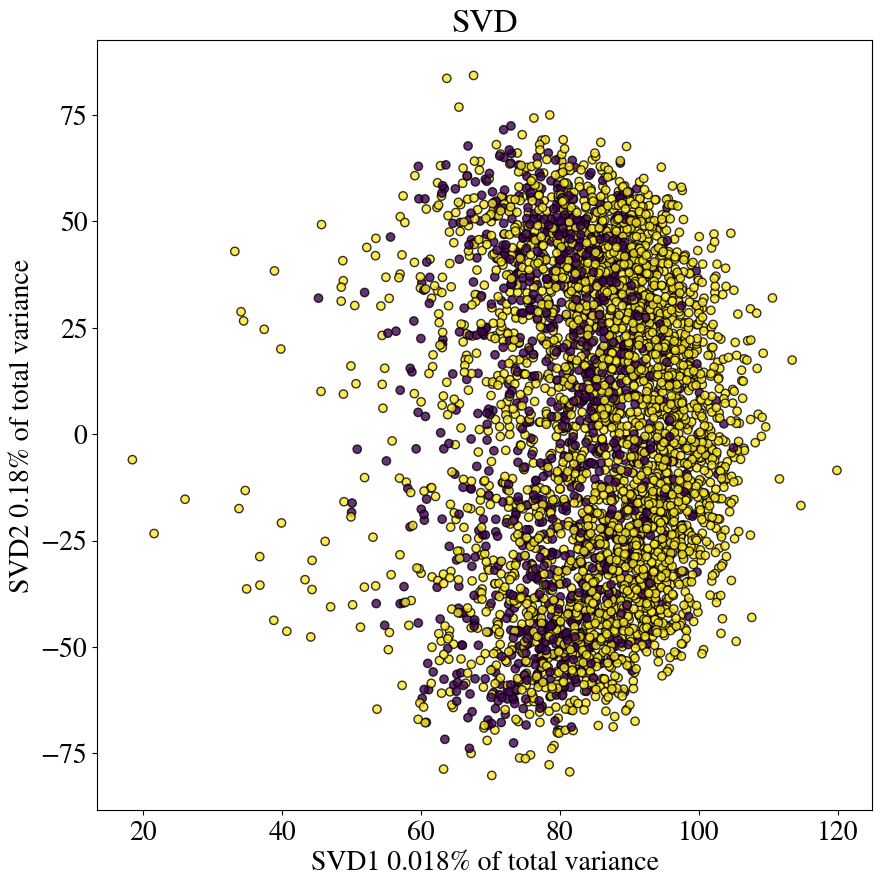

In [60]:
plt.figure(figsize = (10,10))
plt.title("SVD")
plt.scatter(x = X_train_svd[:,0],y = X_train_svd[:,1], c = y_train,edgecolors= "black", alpha = 0.8)
plt.xlabel(f"SVD1 {round(svd.explained_variance_ratio_[0],3)}% of total variance")
plt.ylabel(f"SVD2 {round(svd.explained_variance_ratio_[1],3)}% of total variance")
plt.show()

We go ahead an plot the cummulative variance ratio explained for each of the principal components

In [61]:
svd.explained_variance_ratio_.sum()

0.9526888737917778

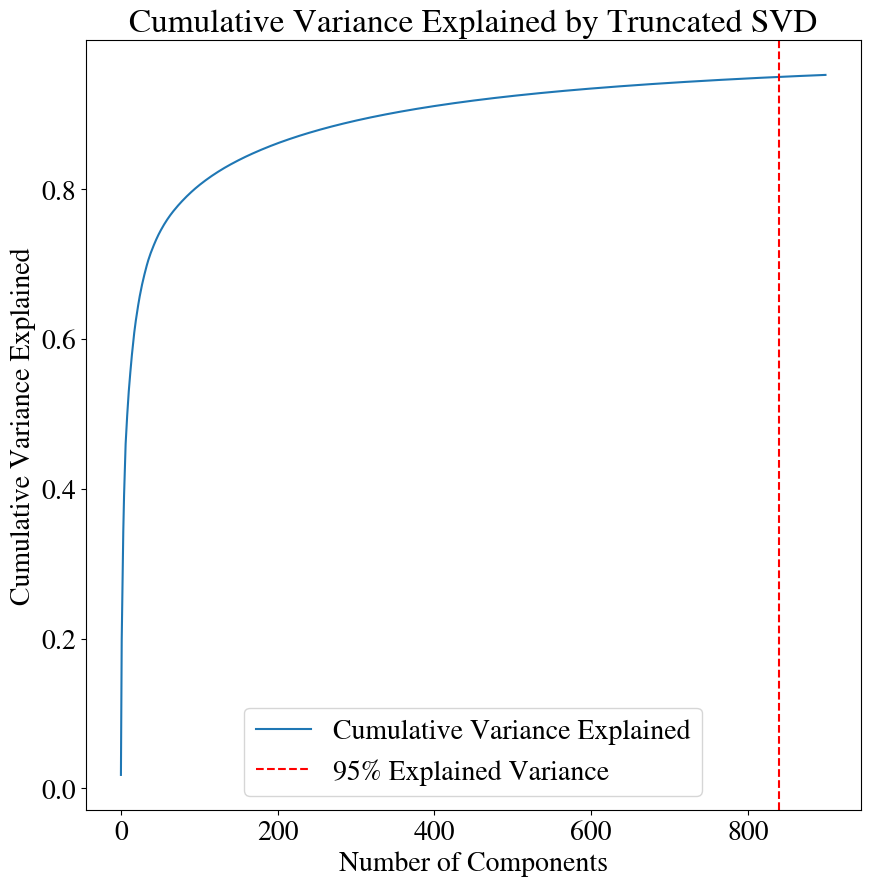

95% variance is achieved at 840 Principal Componenets


In [56]:
cumulative_variance = np.cumsum(svd.explained_variance_ratio_)

explained_variance_ratio_95 = 0.95
index_95 = np.argmax(cumulative_variance >= explained_variance_ratio_95)
plt.figure(figsize = (10,10))
plt.plot(cumulative_variance, label='Cumulative Variance Explained')
plt.axvline(x=index_95, color='r', linestyle='--', label='95% Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.legend()
plt.title('Cumulative Variance Explained by Truncated SVD')
plt.show()

print(f"95% variance is achieved at {index_95} Principal Componenets")

In [63]:
X_train_svd = X_train_svd[:,:index_95]

Now lets get a better visual understanding of our dataset so far using `UMAP`:

As you can see the non pneumonia patatients (purple) are only somewhat seperable from the pneumonia patients (red) in the 2-D UMAP space of our dataset.

<Figure size 1000x1000 with 0 Axes>

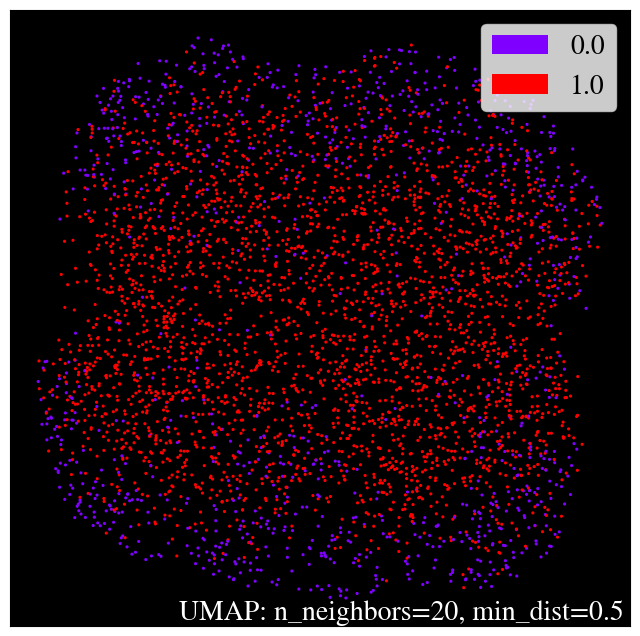

In [70]:
umap_obj = umap.UMAP(n_neighbors = 20, min_dist = 0.5)
umap_result = umap_obj.fit_transform(X_train_svd)
plt.figure(figsize = (10,10))
umap.plot.points(umap_obj, labels=y_train, theme = "fire")
plt.show()

Having define our feature extraction method we go ahead and apply  the fitted PCA to transform the validation and test set.

In [71]:
X_test_svd = svd.transform(X_test)
X_val_svd = svd.transform(X_val)
X_test_svd = X_test_svd[:,:index_95]
X_val_svd = X_val_svd[:,:index_95]
print(f"Test set shape:{X_test_svd.shape}")
print(f"Validation set shape:{X_val_svd.shape}")

Test set shape:(624, 840)
Validation set shape:(1047, 840)


### *Classifier creation*

We create a function to score our predictions with different metrics and plot them.

Lets note again that `0` corresponds to the non-pneumonia class and `1` to pneumonia positive class. The metrics we utilize are:
- The area under the curve `ROC AUC` which corresponds to area under the ROC curve, where the scores are weighted based on the support of each class (0-1 value range)
- The  Matthews correlation coefficient (MCC) as explained in the beginning is a balanced metric, adjusted for chance(-1,1 value range)
- Precision is the proportion of true positive predictions (in this case, the patients correctly identified as having Pneumonia) over all positive predictions, meaning all patients predicted as having Pneumonia)
- Recall is the proportion of true positive predictions (patients correctly identified as having Pneumonia) over all actual positives, meaning all patients who actually have Pneumonia)
- F1 is the harmonic mean of Precision and Recall
- Since this is an inbalanced problem accuracy is a very bad metric to use in this context since it measures label matching between true and predicted values, we use it just for comparrison. 
- On the other hand balanced accuracy is defined as the average of recall obtained on each class adjusted for chance.

**Thus the two most important metrics to focus on is balanced accuracy and MMCC**

In [34]:
   def score(y_test, y_pred):
        # Compute the confusion matrix
        cm = confusion_matrix(y_test, y_pred)
        # Compute the scores
        roc = roc_auc_score(y_test, y_pred,average = 'weighted')
        mcc = matthews_corrcoef(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        balanced_accuracy = balanced_accuracy_score(y_test, y_pred, adjusted = True)
        f1 = f1_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        accuracy = accuracy_score(y_test, y_pred)
        # store them in a dictionary
        scores_dict = {"F1": f1, "Balanced Accuracy": balanced_accuracy, "Precision": precision, "MCC": mcc,
                       "Recall": recall, "ROC AUC": roc, "Accuracy": accuracy}
        # Plot the confusion matrix
        plt.figure(figsize=(5,5))
        sns.heatmap(cm, annot=True, fmt="d")
        plt.xlabel('Predicted')
        plt.ylabel('Truth')

        plt.show()
        # Also plot the results
        df = pd.DataFrame.from_dict(scores_dict, orient='index', columns=['score'])
        plt.figure(figsize=(5,5))
        sns.heatmap(df, annot=True, cmap='coolwarm')
        plt.show()
        return scores_dict

#### **Establishing Baseline Classifiers.**

Baseline classifiers are relatively simple in their mathematical nature and do not require hyperparameter tuning. They serve as a foundation for evaluating the performance of more complex models that will be explored later.

##### **Gaussian Naive Bayes (GNB) baseline classifier.**

Since the GNB classifier does not require tuning, we can use it as  a baseline classifier to compare it to others.

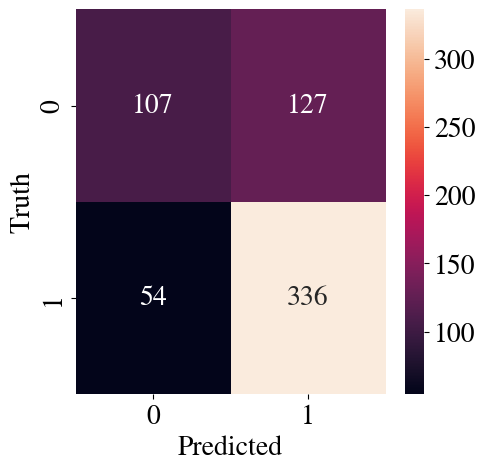

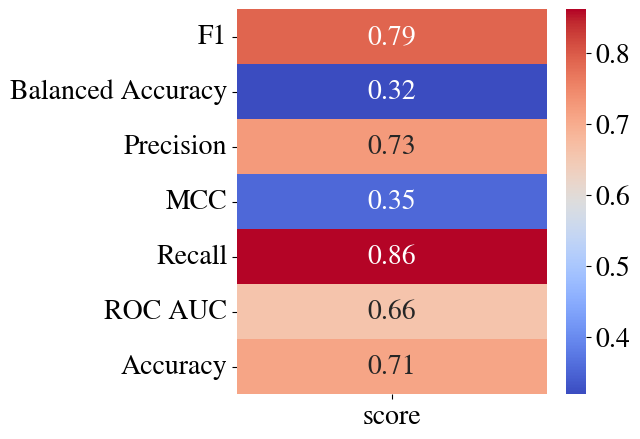

In [73]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train_svd, y_train)
y_pred = gnb.predict(X_test_svd)
gnd_scores = score(y_test,y_pred)

##### **Linear Discriminant Analysis baseline classifier**

The GNB is a generative classifier that requires many more parameters than discriminant classifiers, thus it can suffer from the curse of dimensionality in this dataset. LDA essentialy assumes that the data is normally distributed and that the class covariances are equal and projects the original feature space onto a lower-dimensional space by maximizing the separation between classes while minimizing the variance within each class. It then fits a linear seperation hyperplane.

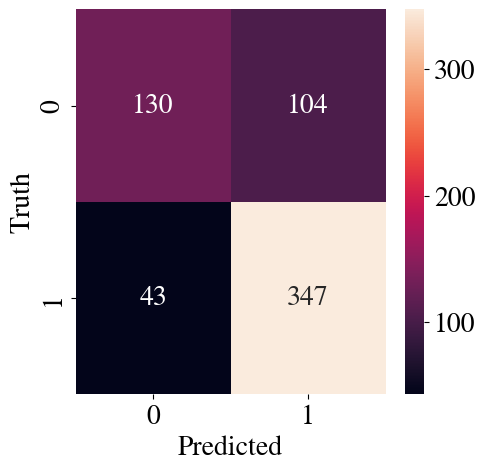

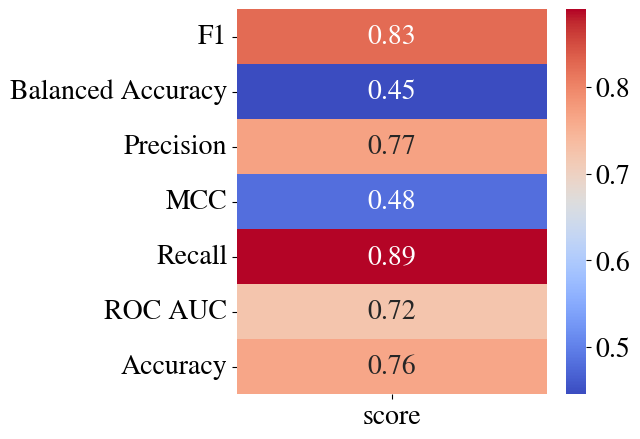

In [74]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
lda = LinearDiscriminantAnalysis()
lda.fit(X_train_svd, y_train)
y_pred = lda.predict(X_test_svd)
lda_scores = score(y_test,y_pred)

#### _**Avanced classifiers**_

These classifiers require hyperparameter tuning with the validation set but also allow for regularization and the consideration of class weights which can significantly boost the performance of these models.

##### **Logistic Regression classifier**
Logistic regression is a linear classification model that allows for regularization via:
- C: Which correponds to the inverse  of regularization strength in logistic regression, controlling the amount of regularization applied via multiplying the value of C with the norm of the coefficients. Smaller values indicate stronger regularization.
- penalty: Corresponds to  either the l1 or l2 norm of of the values of the coefficients which is added as regularization term.


In [110]:
def objective(trial):
    penalty = trial.suggest_categorical('penalty', ['l1', 'l2'])
    C = trial.suggest_float('C', 0.001, 100.0, log=True)
    lr = LogisticRegression(penalty=penalty, C=C, solver='liblinear', random_state=42, class_weight=class_weights)
    
    lr.fit(X_train, y_train)
    y_pred = lr.predict(X_val)
    mcc = matthews_corrcoef(y_val, y_pred)

    return mcc

sampler = optuna.samplers.TPESampler(multivariate=True, seed=42, warn_independent_sampling=False)
pruner = optuna.pruners.HyperbandPruner()
study = optuna.create_study(direction='maximize', sampler=sampler, pruner=pruner)
study.optimize(objective, n_trials=50, show_progress_bar=True, n_jobs=-1)
best_params = study.best_params
best_mcc = study.best_value

  0%|          | 0/50 [00:00<?, ?it/s]

In [115]:
print(best_params)

{'penalty': 'l2', 'C': 0.002228080879933441}


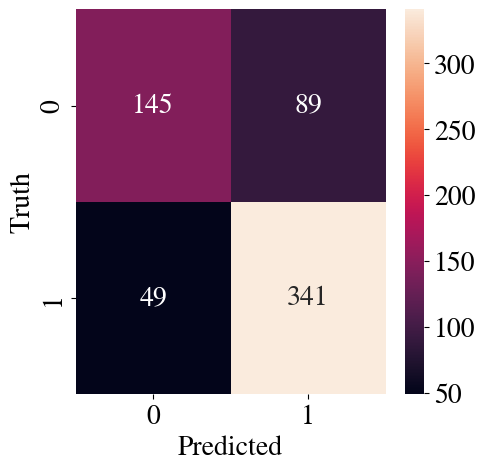

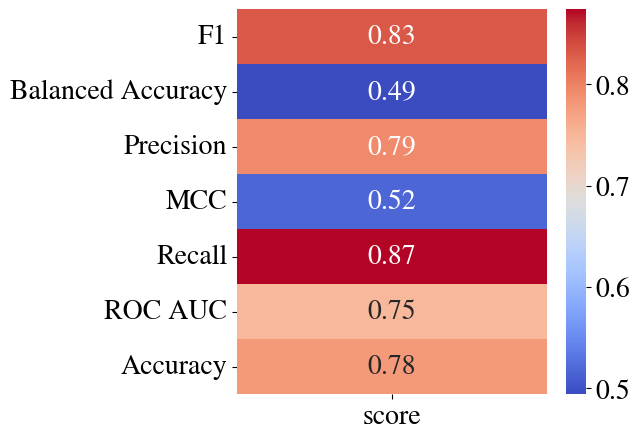

In [114]:
lr = LogisticRegression(C = best_params['C'],penalty = best_params['penalty'],random_state=42,class_weight=class_weights)
lr.fit(X_train_svd,y_train)
y_pred = lr.predict(X_test_svd)
lr_score = score(y_test,y_pred) 

##### **Support vector machine (SVM)**

We use optuna's Bayesian hyperparameter tuning to optimize based on the maximization of the MCC in the validation of the following hyperparameters:
- C: which corresponds to the regularization strenght, essentially a low value of C allows for a smaller margin, meaning that the SVM classifier will try to classify all training examples correctly, potentially leading to overfitting. On the other hand, a lower value of C encourages a larger margin, allowing some training examples to be misclassified, potentially improving generalization on unseen data
- 'kernel': corresponds to the kernel tric utilized to transform the input features we allow a choice between a linear kernel, a radial basis function and a sigmoid kernel 
- 'gamma': Gamma corresponds to the smoothness of the decision surface, we utilize it either via gamma='scale' where it uses 1 / (n_features * X.var()) or as gamma = 'auto’,where it uses 1 / n_features.

The choice of MCC as the metric to maximize during optimization means that the classifier will be balanced without a strong bias to a specific class. 

of course we utilize the class weights as computed in the Data exploration stage with the `class_weight=class_weights` parameter

In [96]:
def objective(trial):
    C = trial.suggest_float('C', 0.001, 100.0,log=True)
    kernel = trial.suggest_categorical('kernel', ['linear', 'rbf', 'sigmoid'])
    gamma = trial.suggest_categorical('gamma', ['scale', 'auto']) if kernel != 'linear' else 'scale'
    svm = SVC(C=C, kernel=kernel, gamma=gamma,class_weight=class_weights,random_state=42)
    
    svm.fit(X_train_svd, y_train)
    y_pred = svm.predict(X_val_svd)
    mcc = matthews_corrcoef(y_val, y_pred)
    return mcc

sampler = optuna.samplers.TPESampler(multivariate =True,seed = 42,warn_independent_sampling=False)
pruner = optuna.pruners.HyperbandPruner()
study = optuna.create_study(direction='maximize',sampler=sampler, pruner=pruner)
study.optimize(objective, n_trials=50, show_progress_bar = True,n_jobs=-1)
best_params = study.best_params
best_mcc = study.best_value

  0%|          | 0/50 [00:00<?, ?it/s]

In [97]:
print(best_params)

{'C': 2.934443400390463, 'kernel': 'rbf', 'gamma': 'scale'}


We also plot the contour plot of the mcc values for the valuse of the regularization parameter $C$ and the type of kernel as identified in the parameter study.

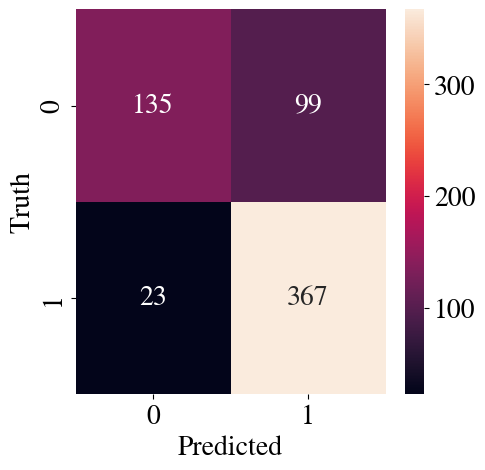

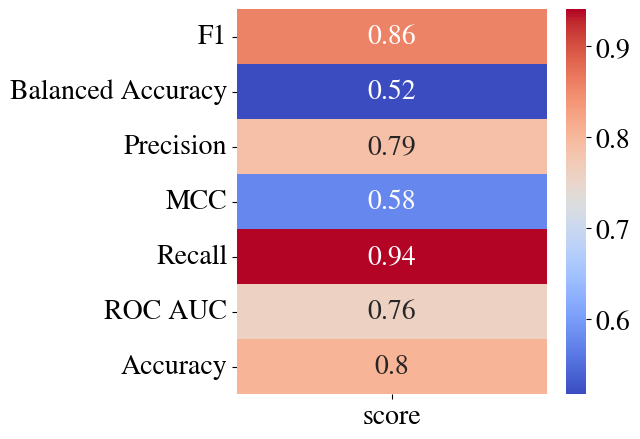

In [99]:
svc = SVC(C = best_params['C'],kernel = best_params['kernel'], gamma = best_params['gamma'],random_state=42,class_weight=class_weights)
svc.fit(X_train_svd,y_train)
y_pred = svc.predict(X_test_svd)
svc_score = score(y_test,y_pred) 

As we see we get a significant boost in accuracy over baseline classifiers.

##### **XGboost tree classifier**
Since the best kernel of the SVM was not liner in nature, we will try another non-linear model with gradient boosted trees that iteratively create an accurate classifier from a weak one.

The parameters tuned are:
- n_estimators: Is the number of trees to be used.
- max_depth: Defines the maximum depth or level of each tree.
- learning_rate: regulates the impact of each individual tree on the final prediction.
- subsample: It represents the fraction of training samples randomly selected for each tree, co
- colsample_bytree: It indicates the fraction of features (columns) randomly selected for each tree.

In [105]:
def objective(trial):
    n_estimators= trial.suggest_int('n_estimators', 50, 500)
    max_depth= trial.suggest_int('max_depth', 3, 10)
    learning_rate= trial.suggest_float('learning_rate', 0.001, 1.0, log=True)
    subsample= trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree= trial.suggest_float('colsample_bytree', 0.1, 1.0)

    xgb_model = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,
                                 subsample=subsample,colsample_bytree=colsample_bytree,seed=42)
    xgb_model.fit(X_train_svd, y_train)
    
    y_pred = xgb_model.predict(X_val_svd)
    mcc = matthews_corrcoef(y_val, y_pred)
    
    return mcc

sampler = optuna.samplers.TPESampler(multivariate=True, seed=42, warn_independent_sampling=False)
pruner = optuna.pruners.HyperbandPruner()
study = optuna.create_study(direction='maximize', sampler=sampler, pruner=pruner)
study.optimize(objective, n_trials=50, show_progress_bar=True, n_jobs=-1)
best_params = study.best_params
best_mcc = study.best_value

  0%|          | 0/50 [00:00<?, ?it/s]

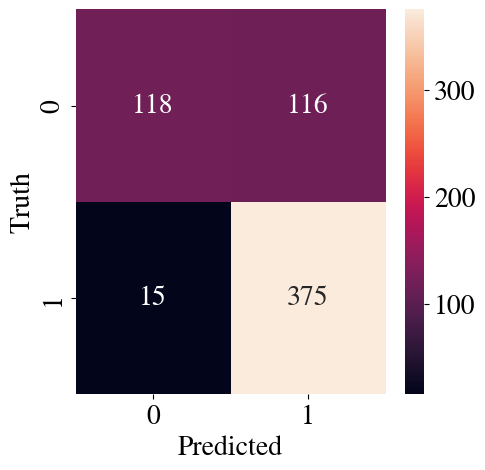

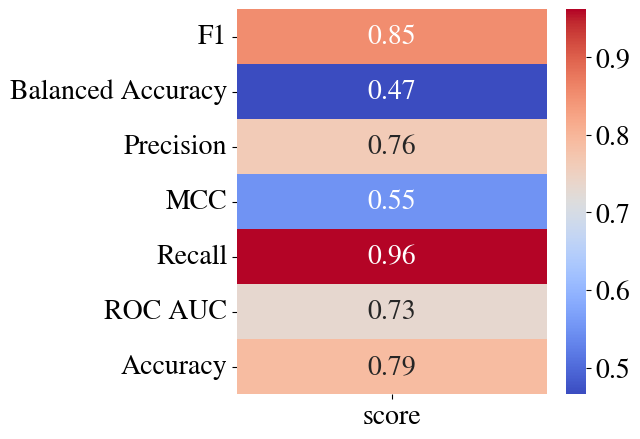

In [108]:
xgb_model = xgb.XGBClassifier(
        n_estimators=best_params['n_estimators'],
        max_depth=best_params['max_depth'],
        learning_rate=best_params['learning_rate'],
        subsample=best_params['subsample'],
        colsample_bytree=best_params['colsample_bytree'],
        random_state=42,
    )

xgb_model.fit(X_train_svd,y_train)
y_pred = xgb_model.predict(X_test_svd)
xgb_score = score(y_test,y_pred) 

*Cleaning models we wont use in the next stage to free up RAM*

In [116]:
del xgb_model, svc , lr 

---

## *2.Classical ML with image feature extraction*



Firstly, we will examine various potential features that we can employ. Moreover, we will develop a function to demonstrate the extracted features from each image using each respective method.

In [294]:
def showcase(image1,image2,label):
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(10, 10))
    ax1.imshow(image1, cmap = "gray")
    ax1.set_title(f'Original Image\nlabel:{label}')
    ax2.imshow(image2,cmap = "gray")
    ax2.set_title(f'Extracted Feature\nlabel:{label}')
    plt.tight_layout()
    plt.show()

### Histogram of Oriented Gradients (HOG)

HOG works by dividing the image into cells and analyzing the distribution of gradient orientations within each cell. The gradients are calculated to measure the changes in pixel intensities, and histograms are constructed to represent the distribution of edge directions. The resulting feature vector captures local shape and edge information, making it useful for classification.

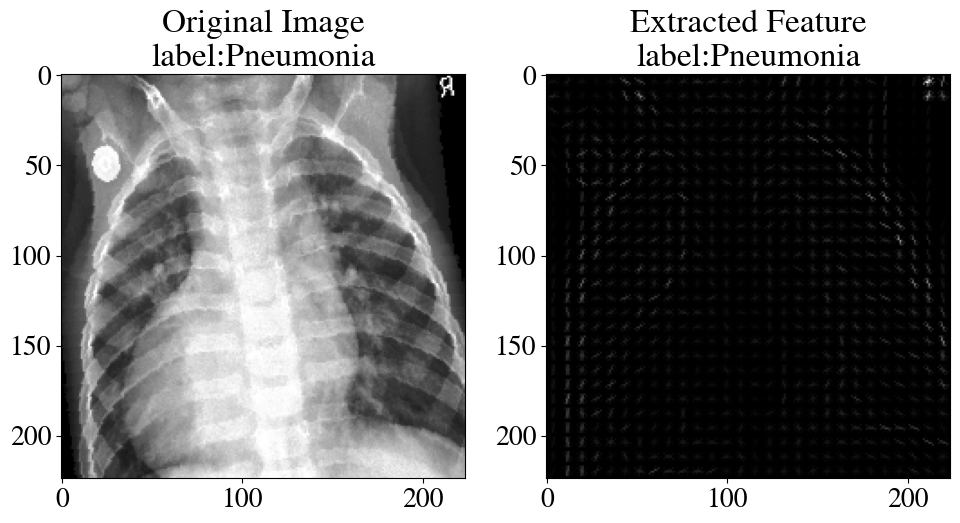

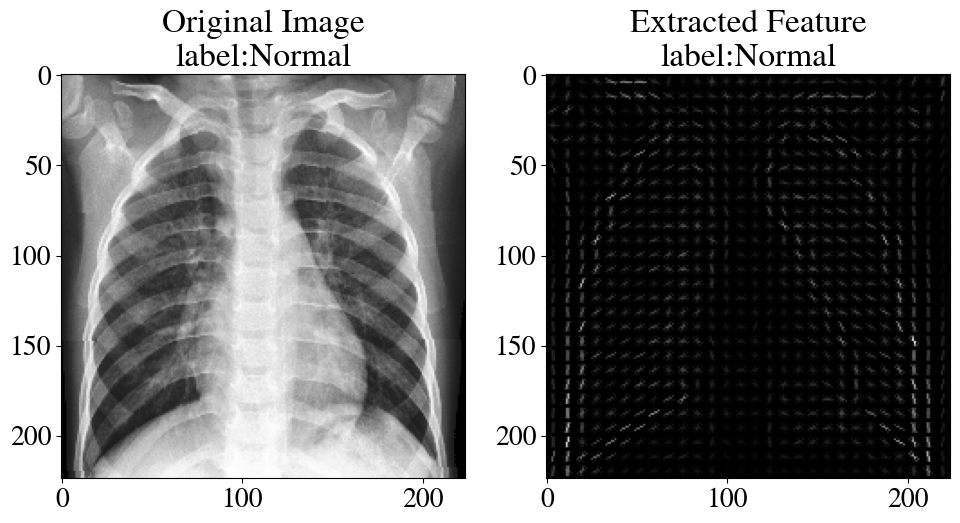

In [317]:
hog = cv2.HOGDescriptor()
random_indices = np.random.randint(0, len(train_dataset_ml), size=2)

for i in random_indices:
    image, label = train_dataset_ml[i]
    image = image.squeeze(0).numpy()  # Convert to numpy array
    hog_features, hog_image = skif.hog(image,visualize= True)
    if i in random_indices:
        showcase(image,hog_image,labels_dict[label.item()])

### Fourier Transformation
The Fourier Transform converts an image from the spatial domain to the frequency domain. It helps identify the frequency components present in the image. High-frequency components correspond to abrupt changes in the image, like edges, and low-frequency components correspond to slow changes, like a smooth gradient.

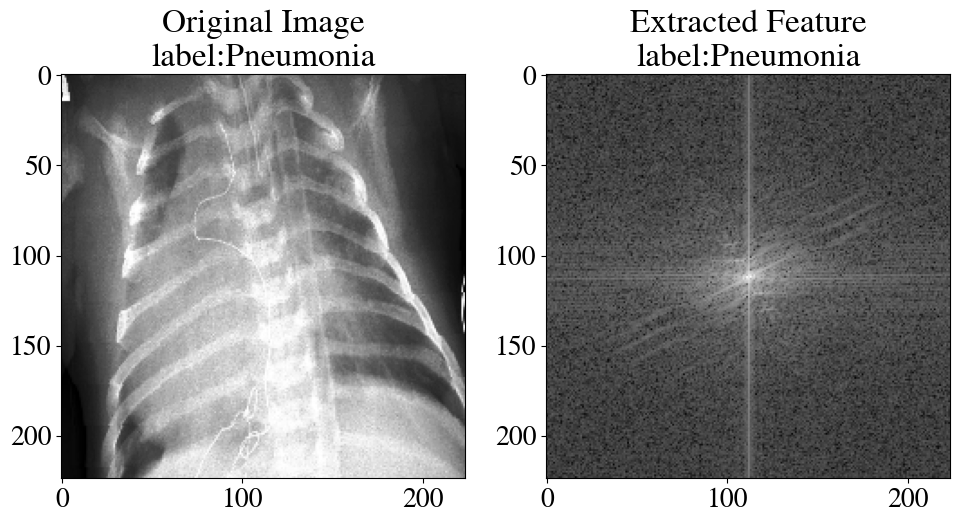

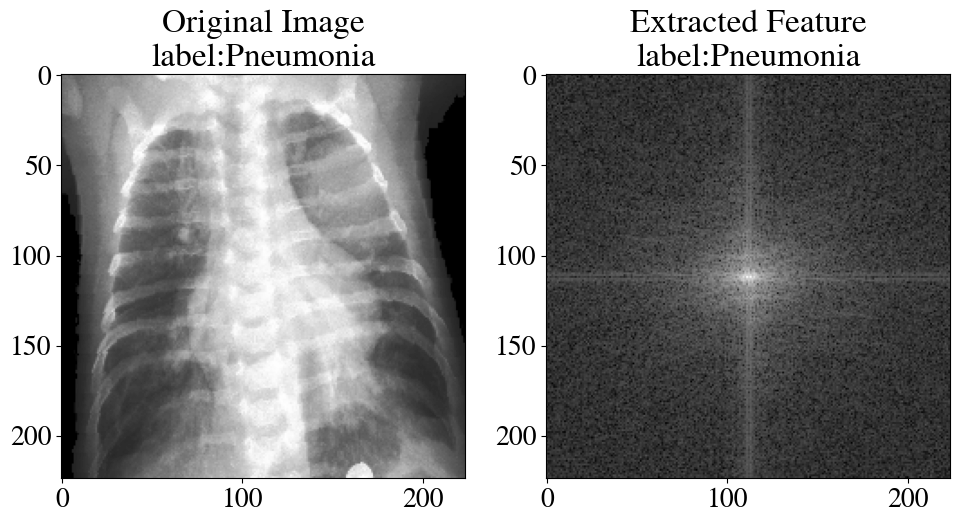

In [329]:
random_indices = np.random.randint(0, len(train_dataset_ml), size=2)
for i in (random_indices):
    image, label = train_dataset_ml[i]
    image = image.squeeze(0).numpy()  # Convert to numpy array
    fourier = np.fft.fft2(image)
    fourier_shifted = np.fft.fftshift(fourier)
    magnitude_spectrum = np.log(1 + np.abs(fourier_shifted))
    showcase(image,magnitude_spectrum,labels_dict[label.item()])

### Perimeter
We can utilize the canny edge detector and then count all the non zero values to find the perimeter. Below we showcase the output of the edge detector

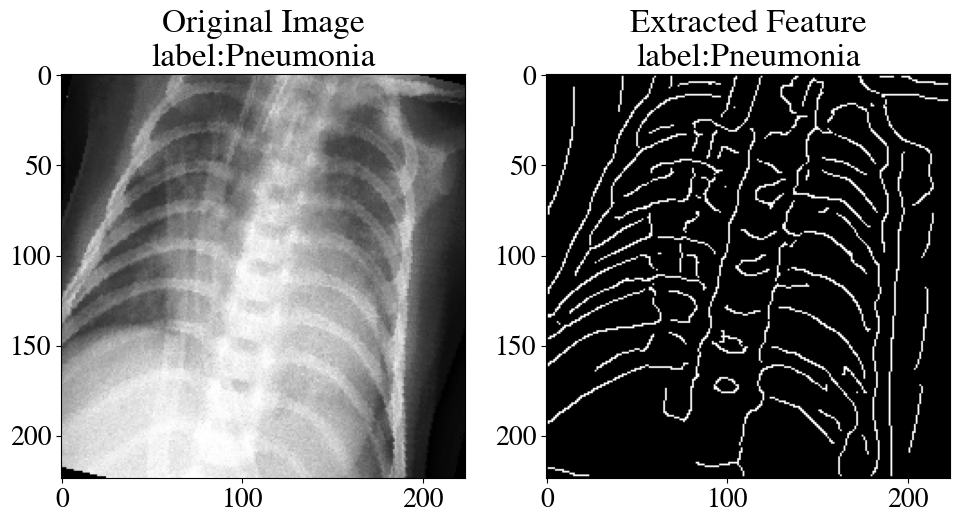

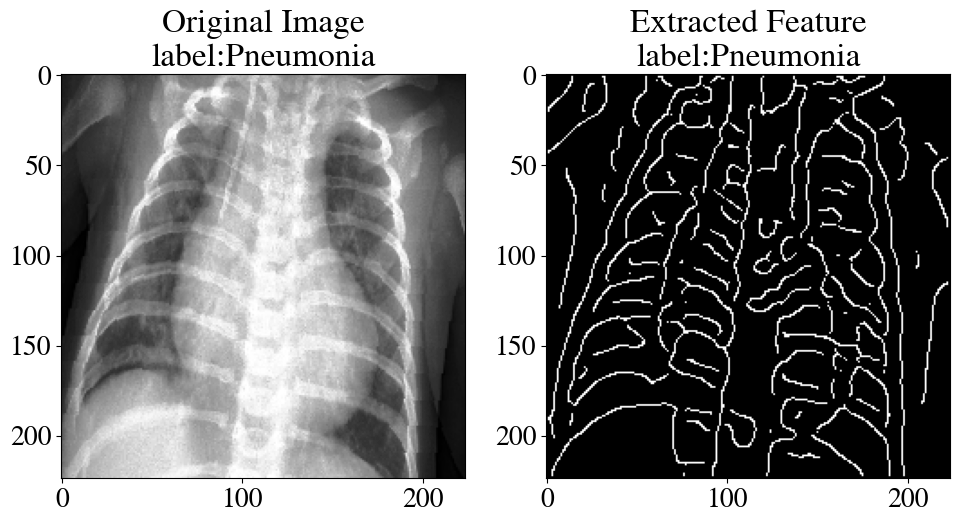

In [328]:
random_indices = np.random.randint(0, len(train_dataset_ml), size=2)
for i in (random_indices):
    image, label = train_dataset_ml[i]
    image = image.squeeze(0).numpy()  # Convert to numpy array
    edges = skif.canny(image, sigma=3)
    showcase(image,edges,labels_dict[label.item()])

### Hu moments 
Each Hu Moment value represents a specific characteristic of the contour in the image, and collectively, they provide a compact representation of the image's properties. They are invariant to translation, scale, and rotation, making them robust features for shape analysis and recognition tasks. 

- Hu1 represents the object's contour overall size or scale.
- Hu2 captures the object's contour rotation.
- Hu3 quantifies the object's contour reflection or mirror symmetry.
- Hu4 characterizes the object's contours elongation or thinness.
- Hu5 relates to the object's contour bending or curvature.
- Hu6 represents higher-order contour variations.
- Hu7 reflects the object's contour smoothness or roundedness.

[ 8.98900000e+03  7.56044330e+07  2.40084772e+09  2.48793834e+09
  6.08029679e+18  2.16159525e+13 -5.37193623e+16]


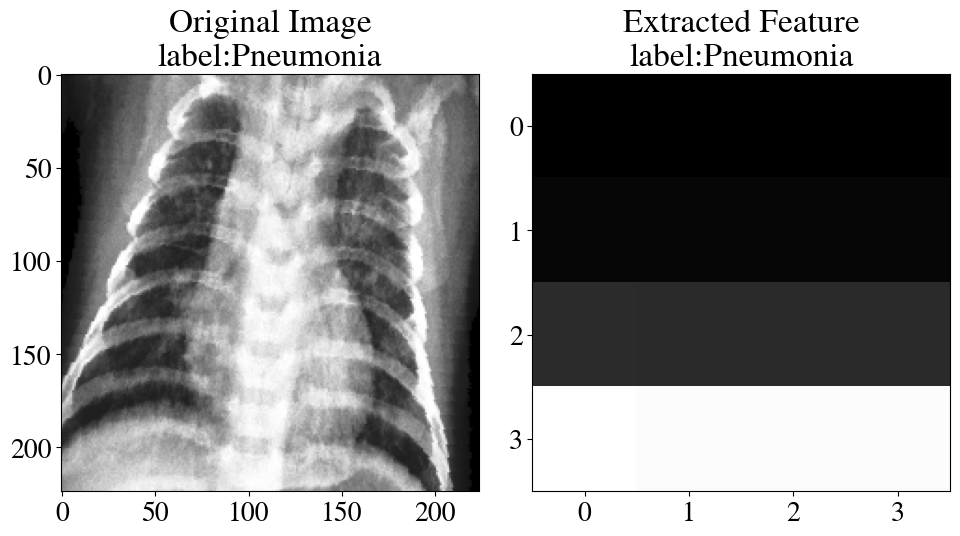

[ 1.80440491e+10  3.25585371e+20  8.22498209e+25  8.22505100e+25
  6.76511806e+51  1.48412691e+36 -3.45722328e+43]


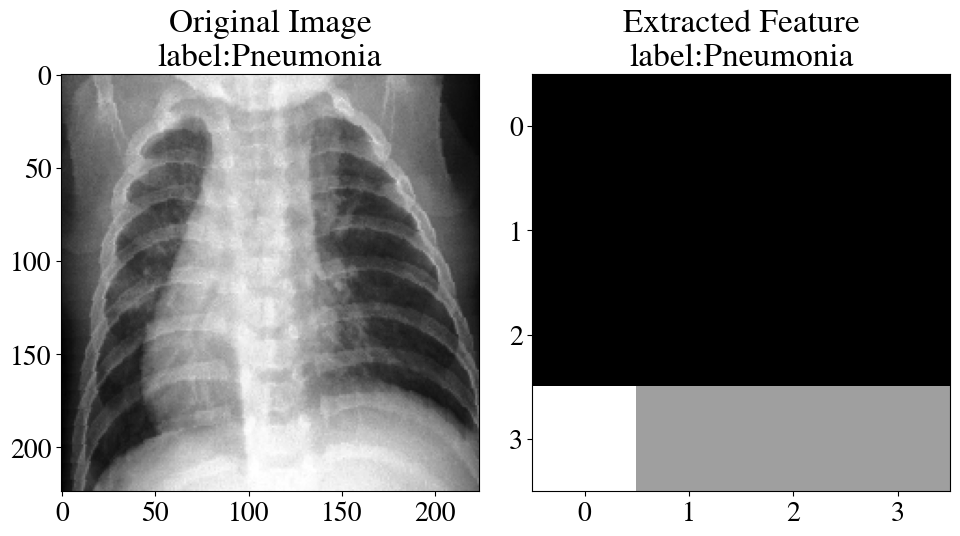

In [394]:
random_indices = np.random.randint(0, len(train_dataset_ml), size=2)
for i in (random_indices):
    image, label = train_dataset_ml[i]
    image = image.squeeze(0).numpy()  # Convert to numpy array
    thresholded = image > 0.5
    contours = measure.find_contours(thresholded, 0.5, fully_connected='high')
    moments = measure.moments(contours[0])
    hu_moments = measure.moments_hu(moments)
    print(hu_moments)
    showcase(image,moments,labels_dict[label.item()])

## **Creating our own feature vectors**

Since we need features that are invariant to rotation as we have applied it as an augmentation step, that leave us with:
- Statistical metrics of the distribution of intensity 
- The perimeter as calculated by the number of edge pixels 
- The Hu Moments which are also invariant to rotation 

In [507]:
def build_features(dataset):
    X = np.zeros((len(dataset),13))
    for i in range(len(dataset)):
        image, _ = dataset[i]
        image = image.squeeze(0).numpy()  # Convert to numpy array
        # Intensity 
        X[i,1] = np.mean(image)
        X[i,2] = np.std(image)
        # Perimeter 
        edges = skif.canny(image, sigma=3)
        X[i,5] = np.count_nonzero(edges)
        # Moments
        thresholded = image > 0.5
        contours = measure.find_contours(thresholded, 0.5, fully_connected='high')
        moments = measure.moments(contours[0])
        hu_moments = measure.moments_hu(moments)
        X[i,6:13] = hu_moments
    return X

X_train_fe = build_features(train_dataset_ml)
X_val_fe = build_features(val_dataset_ml)
X_test_fe = build_features(test_dataset_ml)

We perform standardization

In [508]:
from sklearn.preprocessing import MinMaxScaler
scaler = StandardScaler()
X_train_fe = scaler.fit_transform(X_train_fe)
X_val_fe = scaler.transform(X_val_fe)
X_test_fe = scaler.transform(X_test_fe)

And before procceding with classification, we visualize the results:
As you can see the seperation of the classes is not as evident as it was when using SVD with our 11-D feature vector.

<Figure size 1000x1000 with 0 Axes>

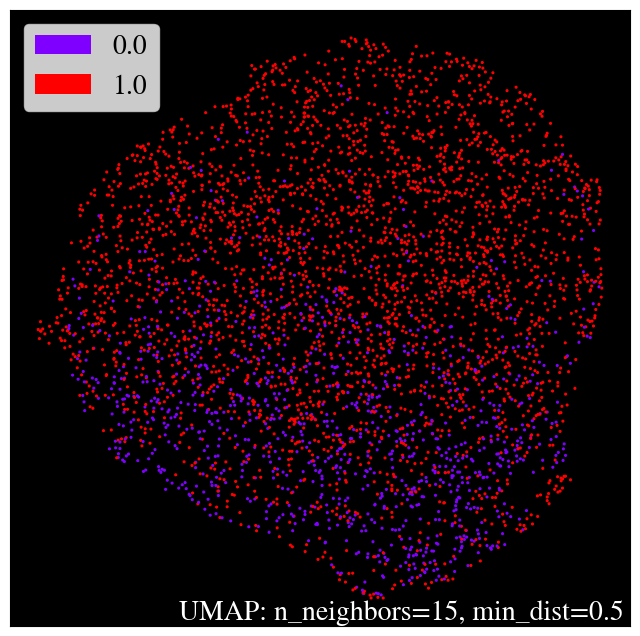

In [509]:
umap_obj = umap.UMAP(n_neighbors = 15, min_dist = 0.5)
umap_result = umap_obj.fit_transform(X_train_fe)
plt.figure(figsize = (10,10))
umap.plot.points(umap_obj, labels=y_train, theme = "fire")
plt.show()

## **Classification**

### **LogisticRegression**

In [531]:
def objective(trial):
    penalty = trial.suggest_categorical('penalty', ['l1', 'l2'])
    C = trial.suggest_float('C', 0.001, 100.0, log=True)
    lr = LogisticRegression(penalty=penalty, C=C, solver='liblinear', random_state=42, class_weight=class_weights)
    
    lr.fit(X_train_fe, y_train)
    y_pred = lr.predict(X_val_fe)
    mcc = matthews_corrcoef(y_val, y_pred)

    return mcc

sampler = optuna.samplers.TPESampler(multivariate=True, seed=42, warn_independent_sampling=False)
pruner = optuna.pruners.HyperbandPruner()
study = optuna.create_study(direction='maximize', sampler=sampler, pruner=pruner)
study.optimize(objective, n_trials=100, show_progress_bar=True, n_jobs=-1)
best_params = study.best_params
best_mcc = study.best_value

  0%|          | 0/100 [00:00<?, ?it/s]

In [532]:
print(best_params)

{'penalty': 'l2', 'C': 0.0010148093975899666}


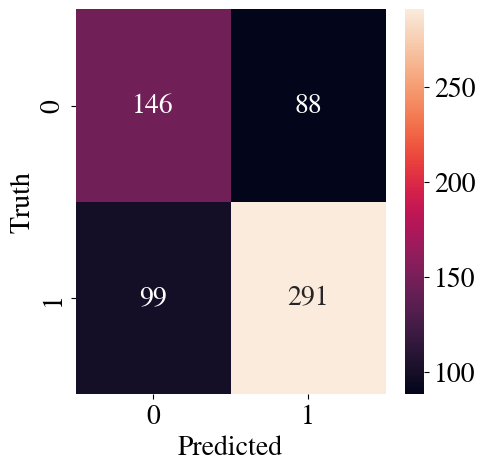

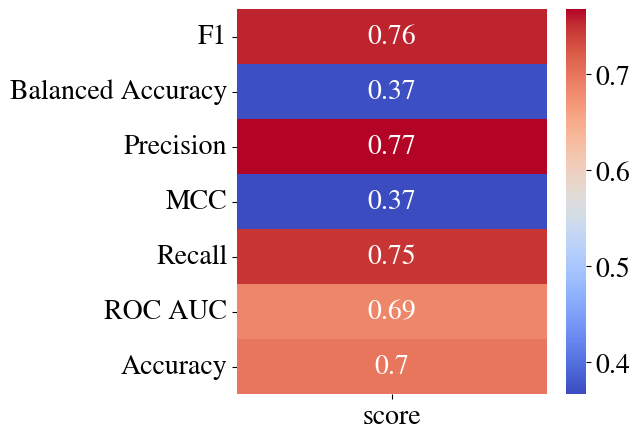

In [533]:
lr = LogisticRegression(C = best_params['C'],penalty = best_params['penalty'],random_state=42,class_weight=class_weights,solver='liblinear')
lr.fit(X_train_fe,y_train)
y_pred = svc.predict(X_test_fe)
svc_score = score(y_test,y_pred) 

### **Support Vector Machines**

In [534]:
def objective(trial):
    C = trial.suggest_float('C', 0.001, 100.0,log=True)
    kernel = trial.suggest_categorical('kernel', ['linear', 'rbf', 'sigmoid'])
    gamma = trial.suggest_categorical('gamma', ['scale', 'auto']) if kernel != 'linear' else 'scale'
    svm = SVC(C=C, kernel=kernel, gamma=gamma,class_weight=class_weights,random_state=42)
    
    svm.fit(X_train_fe, y_train)
    y_pred = svm.predict(X_val_fe)
    mcc = matthews_corrcoef(y_val, y_pred)
    return mcc

sampler = optuna.samplers.TPESampler(multivariate =True,seed = 42,warn_independent_sampling=False)
pruner = optuna.pruners.HyperbandPruner()
study = optuna.create_study(direction='maximize',sampler=sampler, pruner=pruner)
study.optimize(objective, n_trials=100, show_progress_bar = True,n_jobs=-1)
best_params = study.best_params
best_mcc = study.best_value

  0%|          | 0/100 [00:00<?, ?it/s]

In [535]:
print(best_params)

{'C': 10.719475854163678, 'kernel': 'rbf', 'gamma': 'auto'}


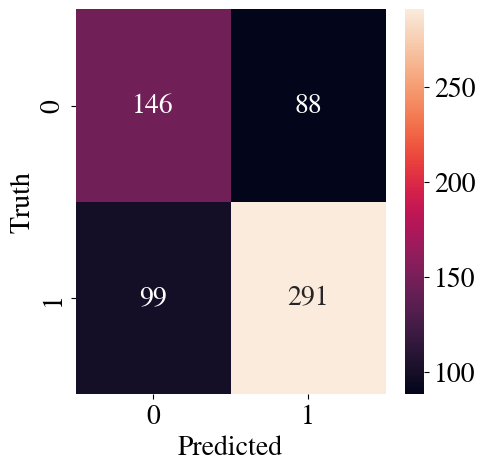

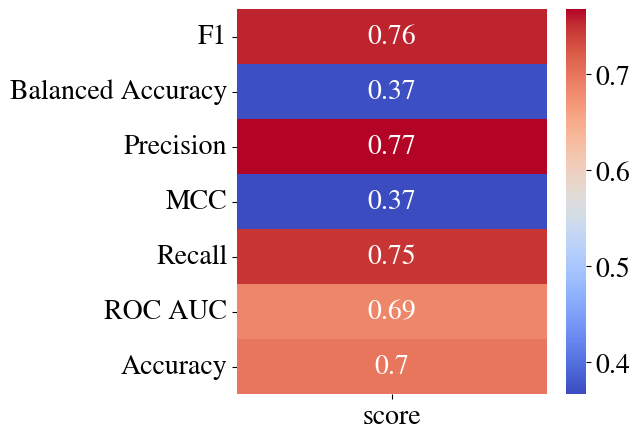

In [536]:
svc = SVC(C = best_params['C'],kernel = best_params['kernel'], gamma = best_params['gamma'],random_state=42,class_weight=class_weights)
svc.fit(X_train_fe,y_train)
y_pred = svc.predict(X_test_fe)
svc_score = score(y_test,y_pred) 

### **XgBoost**

In [524]:
def objective(trial):
    n_estimators= trial.suggest_int('n_estimators', 50, 500)
    max_depth= trial.suggest_int('max_depth', 3, 10)
    learning_rate= trial.suggest_float('learning_rate', 0.001, 1.0, log=True)
    subsample= trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree= trial.suggest_float('colsample_bytree', 0.1, 1.0)

    xgb_model = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,
                                 subsample=subsample,colsample_bytree=colsample_bytree,seed=42)
    xgb_model.fit(X_train_fe, y_train)
    
    y_pred = xgb_model.predict(X_val_fe)
    mcc = matthews_corrcoef(y_val, y_pred)
    
    return mcc

sampler = optuna.samplers.TPESampler(multivariate=True, seed=42, warn_independent_sampling=False)
pruner = optuna.pruners.HyperbandPruner()
study = optuna.create_study(direction='maximize', sampler=sampler, pruner=pruner)
study.optimize(objective, n_trials=100, show_progress_bar=True, n_jobs=-1)
best_params = study.best_params
best_mcc = study.best_value

  0%|          | 0/100 [00:00<?, ?it/s]

In [526]:
print(best_params)

{'n_estimators': 120, 'max_depth': 8, 'learning_rate': 0.890451495247188, 'subsample': 0.33564659213375936, 'colsample_bytree': 0.835733660440412}


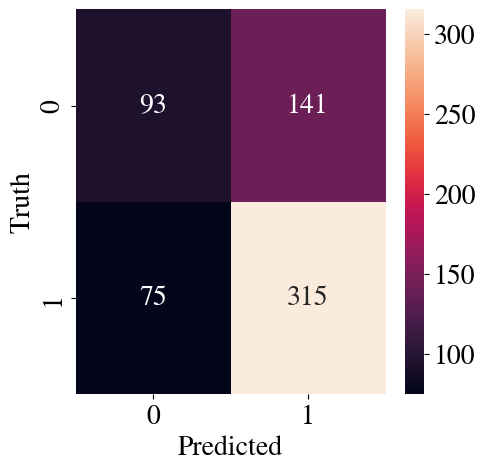

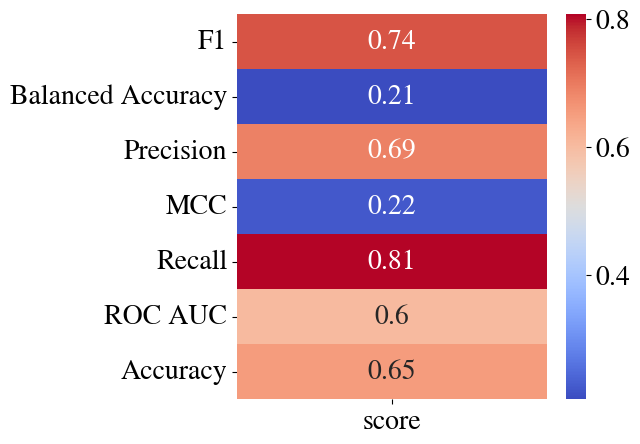

In [527]:
xgb_model = xgb.XGBClassifier(
        n_estimators=best_params['n_estimators'],
        max_depth=best_params['max_depth'],
        learning_rate=best_params['learning_rate'],
        subsample=best_params['subsample'],
        colsample_bytree=best_params['colsample_bytree'],
        random_state=42,
    )

xgb_model.fit(X_train_fe,y_train)
y_pred = xgb_model.predict(X_test_fe)
xgb_score = score(y_test,y_pred) 

---

# **Deep Neural Netwrok Approach**

Before switching gears, lets delete some variables from the classic ML workflow that take a lot of RAM and we wont use again.

In [1]:
del X_train, X_test, X_val, y_train, y_val, X_train_svd, X_test_svd, X_val_svd, \
y_pred, svc, gnb, lda, umap_obj, umap_result

## **Our own CNN implementation using Pytorch**

The architecture of our CNN implementation is a simple one:
- In its feature extraction base it consists of one convolutional layers followed by  max pooling, the ReLu activation function is utilized to introduce non-linearity between the convolution and pooling.
- its MLP head, a simple Network with one fully connected hidden layer is used after flattening the features extracted. 
- Batch normalization layers are utilized to normalize the weights in each layer and help to avoid gradient explosion/vanishing, thus making the optimization problem of the loss function much more smoother and stable: [Santurkar, S., Tsipras, D., Ilyas, A., & Madry, A. (2018). How does batch normalization help optimization? Advances in Neural Information Processing Systems, 31.](https://papers.nips.cc/paper_files/paper/2018/hash/905056c1ac1dad141560467e0a99e1cf-Abstract.html).

Since we need to know the input for the input dense layer after flatten we use the convolutional formulas to identify the input dimensions. 

In [138]:
class customCNNM(nn.Module):
    def __init__(self,img_size=224,out_channels1=16,out_features=256,kernel_size_conv=3,num_classes=2):
        super(customCNNM, self).__init__()

        # This is the base of the network 
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=out_channels1, kernel_size=kernel_size_conv,stride=1)
        self.bn1 = nn.BatchNorm2d(num_features=out_channels1)
        self.relu1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=2,stride=2)
        
        conv_output_size = (img_size - kernel_size_conv + 1) // 1
        maxpool_output_size = (conv_output_size - 2) // 2 + 1
        flatten_size = maxpool_output_size * maxpool_output_size * out_channels1
        
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(in_features=flatten_size, out_features=out_features)
        self.bn3 = nn.BatchNorm1d(num_features=out_features)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(in_features=out_features,out_features=num_classes)
    
    def forward(self, X):
        X = self.conv1(X)
        X = self.bn1(X)
        X = self.relu1(X)
        X = self.maxpool1(X)
        
        X = self.flatten(X)
        X = self.fc1(X)
        X = self.bn3(X)
        X = self.relu3(X)
        X = self.fc2(X)

        return X

Having defined the model, we need to create the training loop, it takes as arguments:
1. The model architecture
2. The training data loader responsible for loading images based on the specified batch size
3. The validation data loader >> 
4. Class weights to add class size sensitive loss at the cross entropy loss. 
5. The learning rate of the Adam optimizer, which controls how fast the model is being trained. 
6. The number of epochs the model is trained for
7. patience corresponds to the number of epocs allowed for the validation loss to not decrease until we stop training. This allows us to avoid overfitting on the training set.


Training begins: 
1. By moving the batch of tensors loaded at every epoch to the GPU 
2. `optimizer.zero_grad()` initially zeros out the gradients of all the model parameters, in order to calculate new ones for this batch.
3. The model output is calculated and thus we have a value for the loss 
4. Backpropagation from the output to the input layer is used to update the gradients towards the minimization of the loss.
5. Then we go back to 1. to 4. load a new batch, zero out the gradients calculate loss for the new batch then move closer to the minimization of the loss with backpropagation.

Evaluation begins after finishing training for each epoch:
1. We set `torch.no_grad()` since no gradients should be updated at this stage, the model has completed training for this epoch
2. Then we feed the model validation input batch from the validation loader 
3. We then calculate the output of the model
4. Finally the validation loss for this epoch can be calculated by comparing the difference between the output and the true target.

We keep a copy of the best model so far based on the early stopping criterion

In [108]:
class_weights_tn = torch.tensor(list(class_weights.values()))  

def train_model(model, train_loader, val_loader, class_weights_tn, learning_rate, num_epochs, patience):
    train_loss_hist = []
    val_loss_hist = []
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    class_weights_tn = class_weights_tn.float().to(device)
    criterion = nn.CrossEntropyLoss(weight=class_weights_tn)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    model.to(device)

    best_val_loss = float('inf')
    best_model = None
    counter = 0
    stop_training = False

    for epoch in range(num_epochs):
        if stop_training:
            print("Early stopping. No improvement in validation loss.")
            break

        model.train()
        for i, (inputs, labels) in enumerate(train_loader):
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs).float()
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

        train_loss_hist.append(train_loss_hist)
        print(f"Epoch [{epoch + 1}/{num_epochs}], Training Loss: {loss.item():.4f}")
        

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs).float()
                val_loss += criterion(outputs, labels).item()

        val_loss /= len(val_loader)
        val_loss_hist.append(val_loss_hist)
        print(f"Epoch [{epoch + 1}/{num_epochs}], Validation Loss: {val_loss:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            counter = 0
            best_model  = copy.deepcopy(model.state_dict())
        else:
            counter += 1
            if counter >= patience:
                stop_training = True
    
    print("Training complete!\n")
    return best_val_loss, best_model, train_loss_hist, val_loss_hist

Next we also need to define the function to make predictions since the model outputs probabilities for each class.
This of course is similar to what we did for the validation data inside the training loop however this time we are not in a setting with training epochs, we just pass the data in batches and output the label with the highest predicted probability by the model. Of course we set `torch.no_grad()` since we do not want to update the weights of the model.

In [171]:
def predict(model,test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval() 

    y_pred = []

    with torch.no_grad():  
        for images,_ in test_loader:
            images = images.to(device) 
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            y_pred.extend(predicted.cpu().numpy())
    return y_pred

We can go ahead and train our simple CNN model using the grayscale augmented dataset.

In [196]:
class_weights_tn = torch.tensor(list(class_weights.values()))  

model = customCNNM(num_classes=2)
train_loader = DataLoader(train_dataset_ml, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset_ml, batch_size=64, shuffle=False)

best_val_loss, trained_model, train_loss_hist, val_loss_hist = train_model(model, train_loader, val_loader, class_weights_tn, 0.001, 20, 5)

Epoch [1/20], Training Loss: 0.3167
Epoch [1/20], Validation Loss: 0.2003
Epoch [2/20], Training Loss: 0.0694
Epoch [2/20], Validation Loss: 0.1529
Epoch [3/20], Training Loss: 0.1693
Epoch [3/20], Validation Loss: 0.2028
Epoch [4/20], Training Loss: 0.1396
Epoch [4/20], Validation Loss: 0.1404
Epoch [5/20], Training Loss: 0.0698
Epoch [5/20], Validation Loss: 0.1294
Epoch [6/20], Training Loss: 0.2233
Epoch [6/20], Validation Loss: 0.1941
Epoch [7/20], Training Loss: 0.0203
Epoch [7/20], Validation Loss: 0.1791
Epoch [8/20], Training Loss: 0.0606
Epoch [8/20], Validation Loss: 0.1508
Epoch [9/20], Training Loss: 0.0798
Epoch [9/20], Validation Loss: 0.1616
Epoch [10/20], Training Loss: 0.1672
Epoch [10/20], Validation Loss: 0.2167
Early stopping. No improvement in validation loss.
Training complete!



Now we extract the weights of the saved model with the lowest validation loss

In [197]:
model.load_state_dict(trained_model)
summary(model, input_size=(1, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 222, 222]             160
       BatchNorm2d-2         [-1, 16, 222, 222]              32
              ReLU-3         [-1, 16, 222, 222]               0
         MaxPool2d-4         [-1, 16, 111, 111]               0
           Flatten-5               [-1, 197136]               0
            Linear-6                  [-1, 256]      50,467,072
       BatchNorm1d-7                  [-1, 256]             512
              ReLU-8                  [-1, 256]               0
            Linear-9                    [-1, 2]             514
Total params: 50,468,290
Trainable params: 50,468,290
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.19
Forward/backward pass size (MB): 21.06
Params size (MB): 192.52
Estimated Total Size (MB): 213.77
--------------------------------

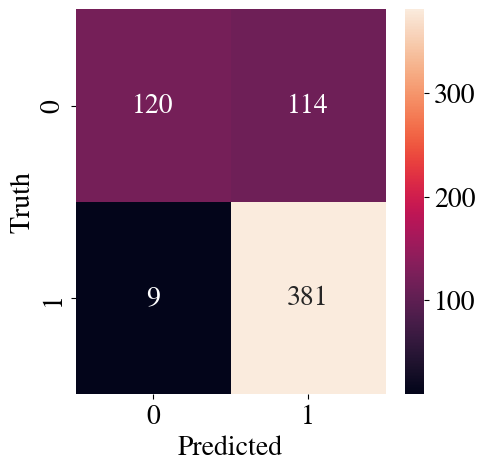

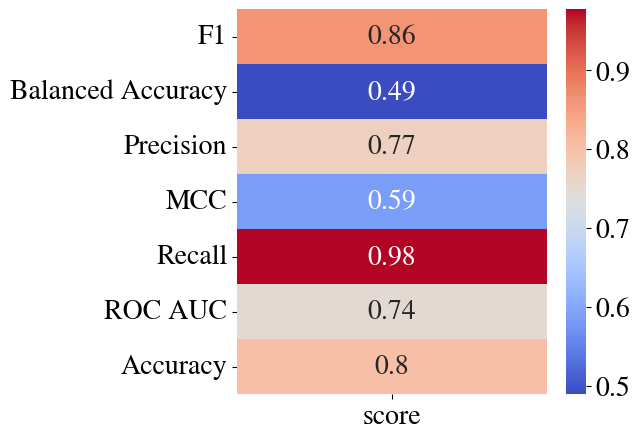

In [198]:
torch.manual_seed(42)
test_loader = DataLoader(test_dataset_ml, batch_size=256, shuffle=False)
y_pred = predict(model,test_loader)
custom_cnn_score = score(y_test,y_pred)

## **Pretrained CNN model base with custom perceptron head: ResNet50**

To implement transfer learning, we essentially substitute the base of our neural network with a pre-existing model, in this case, ResNet50, which has been trained on the ImageNet dataset. We freeze its weights, ensuring they remain unchanged during the training process. We then append a final set of layers designed to meet our specific output requirement of two classes. Only the weights of these additional layers are adjusted throughout the training.

The 50-layer ResNet architecture we use as base includes the following elements:

- A 7×7 kernel convolution alongside 64 other kernels with a 2-sized stride.
- A max pooling layer with a 2-sized stride.
- 9 more layers—3×3,64 kernel convolution, another with 1×1,64 kernels, and a third with 1×1,256 kernels. These 3 layers are repeated 3 times. 
- 12 more layers with 1×1,128 kernels, 3×3,128 kernels, and 1×1,512 kernels, iterated 4 times.
- 18 more layers with 1×1,256 cores, and 2 cores 3×3,256 and 1×1,1024, iterated 6 times.
- 9 more layers with 1×1,512 cores, 3×3,512 cores, and 1×1,2048 cores iterated 3 times.
- Average pooling, followed by a fully connected layer with 1000 nodes, using the softmax activation function.

In [199]:
class CustomResNet(nn.Module):
    def __init__(self, num_classes):
        super(CustomResNet, self).__init__()

        # We Load the pretrained ResNet50 model
        self.resnet = models.resnet50(pretrained=True)

        # We Freeze the pre-trained layers
        for param in self.resnet.parameters():
            param.requires_grad = False

        # We replace the final layer
        num_ftrs = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_ftrs, num_classes)

    def forward(self, x):
        x = self.resnet(x)
        return x

In [202]:
model = CustomResNet(num_classes=2)
train_loader = DataLoader(train_dataset_pre, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset_pre, batch_size=64, shuffle=False)
best_val_loss, trained_model, train_loss_hist, val_loss_hist = train_model(model, train_loader, val_loader, class_weights_tn, 0.001, 20, 5)


Epoch [1/20], Training Loss: 0.1178
Epoch [1/20], Validation Loss: 0.1702
Epoch [2/20], Training Loss: 0.1450
Epoch [2/20], Validation Loss: 0.1411
Epoch [3/20], Training Loss: 0.2769
Epoch [3/20], Validation Loss: 0.1154
Epoch [4/20], Training Loss: 0.1584
Epoch [4/20], Validation Loss: 0.1091
Epoch [5/20], Training Loss: 0.1454
Epoch [5/20], Validation Loss: 0.1179
Epoch [6/20], Training Loss: 0.1246
Epoch [6/20], Validation Loss: 0.1037
Epoch [7/20], Training Loss: 0.2060
Epoch [7/20], Validation Loss: 0.1082
Epoch [8/20], Training Loss: 0.1454
Epoch [8/20], Validation Loss: 0.0980
Epoch [9/20], Training Loss: 0.1078
Epoch [9/20], Validation Loss: 0.0991
Epoch [10/20], Training Loss: 0.1874
Epoch [10/20], Validation Loss: 0.1419
Epoch [11/20], Training Loss: 0.1458
Epoch [11/20], Validation Loss: 0.0983
Epoch [12/20], Training Loss: 0.0807
Epoch [12/20], Validation Loss: 0.1919
Epoch [13/20], Training Loss: 0.0696
Epoch [13/20], Validation Loss: 0.1248
Early stopping. No improvemen

We load the best weights and print the final model architecture.

In [205]:
model.load_state_dict(trained_model)
summary(model, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

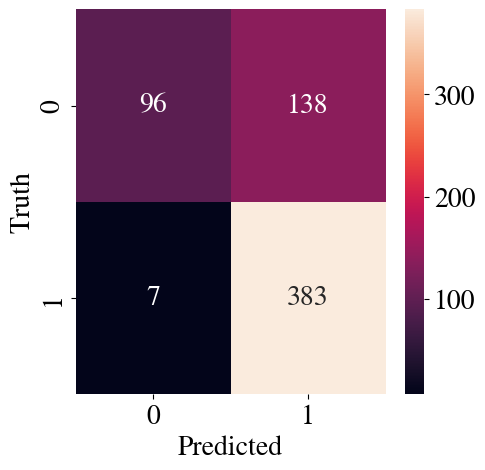

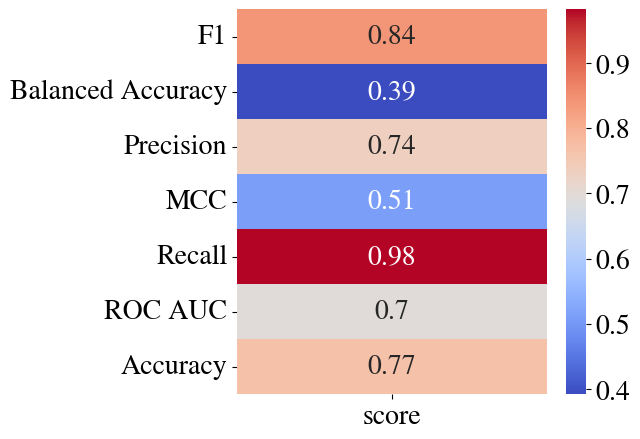

In [210]:
torch.manual_seed(42)
test_loader = DataLoader(test_dataset_pre, batch_size=256, shuffle=False)
y_pred = predict(model,test_loader)
pretrained_cnn_score = score(y_test,y_pred)

# **Discussion**

Regarding our implementation of the traditional Machine Learning methodology, we utilized two distinct strategies:

Firstly, we flattened the resized images and applied SVD to reduce the components to the ones explaining 95% of the variance. This strategy proved to be satisfactory in the context of image classification for the SVM, Logistic Regression, and the XGBoost classifiers. Notably, SVM outperformed the others, achieving an MCC of 0.58 and an accuracy of 0.8.

The second strategy involved extracting features from the images to construct a 13-dimensional feature vector. This vector comprised the mean, standard deviation of pixel intensity, the perimeter derived from Canny edges, and the 7 Hu moments. Unfortunately, this approach did not provide favorable results. We believe that the normalization of pixel intensity and the slight rotations applied during preprocessing for the ML dataset contributed to this. Normalization may have removed important information required for accurate feature extraction. Additionally, the slight rotations introduced during preprocessing could have impacted the Hu moments even though they are more robust to them than HOG and the fourier transformation.

The results of the deep neural approach are intresting. The relatively shallow 3-layer network outperformed the SVM classifier by a small margin as expected althought the parameter trade-off is obviously not worth it. However it also outperformed the performance of the pretrained ResNet-50 network with frozen weights and a trainable output layer classification head.